In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
import pandas as pd
from collections import OrderedDict
from context import lwr_inverse

from lwr_inverse.tools.vis import mcmc_vis_tools
# from lwr_inverse.tools.vis.vis_util import plot_LWR_xt
# from lwr_inverse.lwr.lwr_solver import LWR_Solver

# from lwr_inverse.experiments.delCast_simulated_data_sampler import mcmc
from lwr_inverse.traffic_data.test_data.Simulated_LWR_Nov2018.del_Cast_true_params import FD_delCast_simulated

from lwr_inverse.tools.vis.acf import my_plot_acf

# Del Castillo simulated data - cut (40t) - FD & BC samling

- Correlated PT
-  Here there are 4 untempered chains (`PT_width=4`)


In [10]:
# list S3 directories
s3_list= mcmc_vis_tools.list_S3_dirs(year='2019')

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_7
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_0
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_9
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_11
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_14
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_2
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_4
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_7
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_6
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_15
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_3
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_11
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_1
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_9
2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_8
2019/Oct1_Paper_correlatedPTSampler_

In [3]:
s3_list[-4]

'2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_8'

In [12]:
# Option 1: manually define run number and process
# my_run_string = 'run_1/process_0'
# list_idx = s3_list.index([e for e in s3_list if my_run_string in e][0])
# Download chains from S3
# mcmc_vis_tools.download_chains_from_S3(data_directory=s3_list[list_idx])


# ===============
# Option 2: choose several processes at once
# run_num = 2
# run_list = ['run_{}/process_{}'.format(run_num, elem) for elem in range(0,4)]
# for my_run_string in run_list:
#     list_idx = s3_list.index([e for e in s3_list if my_run_string in e][0])
#     # Download chains from S3
#     mcmc_vis_tools.download_chains_from_S3(data_directory=s3_list[list_idx])

    
# mcmc_vis_tools.download_chains_from_S3(data_directory=s3_list[-8])

In [2]:
paths_hdf5 = mcmc_vis_tools.list_paths()

S3/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_4
S3/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_0
S3/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_8
S3/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_1/process_0


In [3]:
paths = paths_hdf5[1]
mcmc_vis = mcmc_vis_tools.MCMC_vis(data_directory=paths)
# mcmc_vis.move
print("====\n")

mcmc_vis.print_chain_info()

print("{} chains\n----".format(len(mcmc_vis.d_samples)))
print("Number of samples per chain:")
for elem in mcmc_vis.d_samples.values():
    print(len(elem))
    

Number of MCMC chains: 4
Total number of samples: 25704
Samples are taken from ['z', 'rho_j', 'u', 'w', 'BC_outlet', 'BC_inlet', 'param_accept', 'BC_Gibbs']

Data directory: MCMC_outputs/S3/Oct1_Paper_correlatedPTSampler_delCast_DS1/run_2/process_0
====

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/-Run_2
------
{'density': 'data_array_70108_density_49t.csv', 'flow': 'data_array_70108_flow_49t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [0.44, 0.58, 0.76, 1]. Same setup as thesis, but with correlated PT. width=4
------
Step save: 31
------


4 chains
----
Number of samples per chain:
6426
6426
6426
6426


In [4]:
from lwr_inverse.tools.util import FD_neg_power

from lwr_inverse.config import LWRConfigHolder
from lwr_inverse.config import BIN_PATH, default_config_dict

In [49]:

plt.rcParams.update({'font.size': 20})

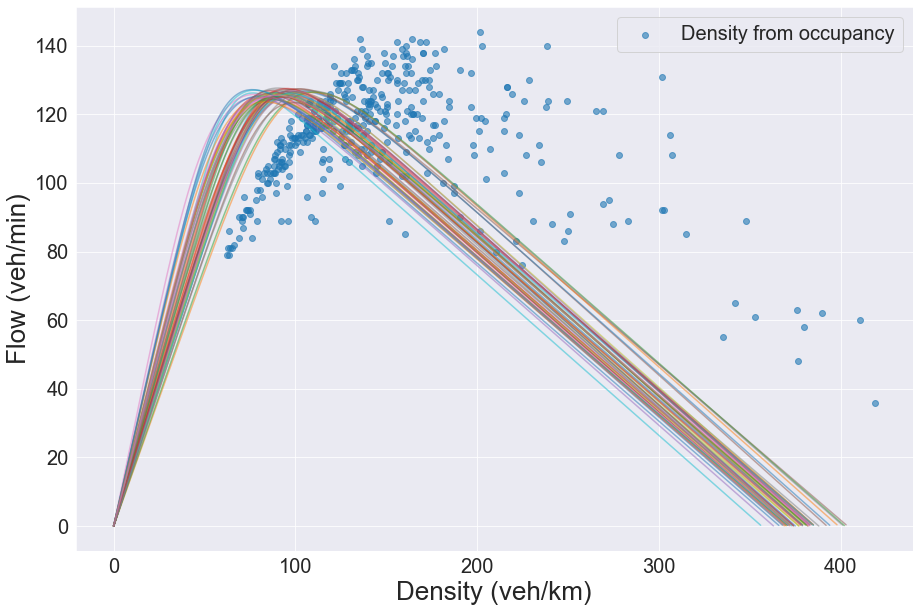

In [50]:
burnin = 300
step = 400
# chain_list = [1,2,3,4,5,6,7,8,9]
chain_list = [1,2,3]
# chain_list = [2]

title_save = None
# title_save = "DelCastSim_FDonly-FDcloud.png"


x_range = np.arange(0, 500,1)
config_dict = {'my_analysis_dir': '2019/Jan3_2019-DelCast_sim-Replica_exchange',
'run_num': 100,
'data_array_dict':{'flow': 'data_array_70108_flow_49t.csv',
                    'density': 'data_array_70108_density_49t.csv'},}

config = LWRConfigHolder(**config_dict)

density_data = np.genfromtxt(config.DATA_DENSITY_PATH)
flow_data = np.genfromtxt(config.DATA_FLOW_PATH)

plt.figure(figsize=(15,10))
plt.scatter(density_data[:,2], flow_data[:,2], alpha=0.6, label="Density from occupancy")
plt.xlabel("Density (veh/km)", size=26)
plt.ylabel("Flow (veh/min)", size=26)


for chain_num in chain_list:
    for idx, elem in mcmc_vis.d_samples[f'MCMC_{chain_num}'].iloc[burnin::step].iterrows():
        le_params = {k:v for k,v in elem.to_dict().items() if k in ['rho_j','u','w','z']}
        le_params['w'] = 1/le_params['w']
        plt.plot(x_range, FD_neg_power(rho=x_range, **le_params), alpha=0.5)

plt.legend()

# plt.savefig("figures/delCast_sim_FDBC-FDsamples.png")

In [7]:


plt.rcParams.update({'font.size': 16})

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/-Run_2
------
{'density': 'data_array_70108_density_49t.csv', 'flow': 'data_array_70108_flow_49t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [0.44, 0.58, 0.76, 1]. Same setup as thesis, but with correlated PT. width=4
------
Step save: 31
------


Random scan Gibbs sampler for FD and BCs:
-----------------------------------------
    FD move:
        probability of selecting move: 0.4
        Random walk for FD parameters using a Gaussian proposal
        Truncated Gaussian proposal for w (ie: reject straight away if w<=0)

    Joint FD & BC move:
        probability of selecting move: 0
        Propose a new FD and update BCs using a deterministic function

    BC move:
        probability of selecting move: 0.6
        Gibbs sampling using blocks:
            section_6: {'cut1': 0, 'cut2': 561, 'param': 'BC_outlet', 'omega': 0.25}
          section_7: {'cut1': 480, 'cut2': 921, 'param': 'BC_outlet', 'omega': 0.21}
 

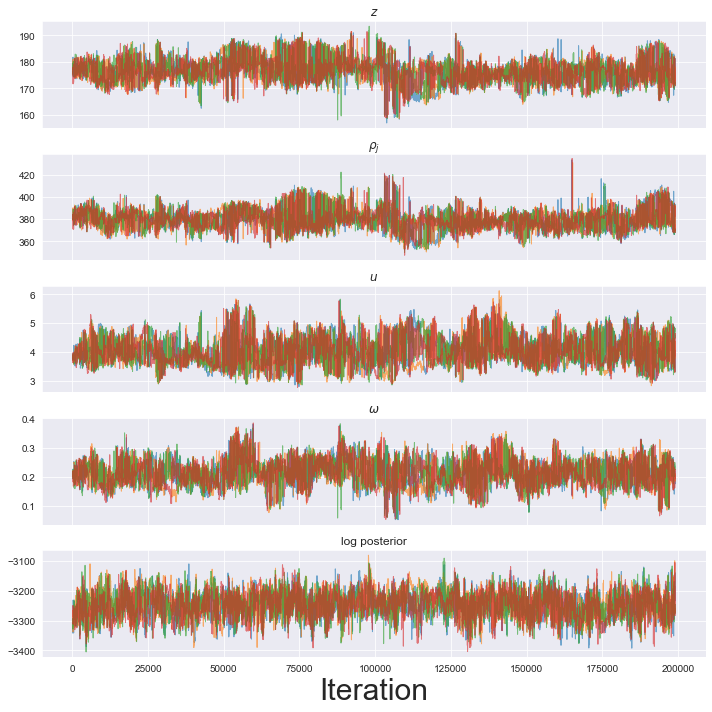

In [4]:
chain_list = list(range(1,12))[:]
# chain_list = [1,3,4,6,7]

mcmc_vis.print_chain_info()
print(mcmc_vis.move)
print("FD covariance:\n{}".format(mcmc_vis.cov))
# print("\nFD joint covariance:\n{}".format(mcmc_vis.cov_joint))
fig, ax = mcmc_vis.trace_plot(chains=chain_list, log_post_lim=-9999999, burnin=0, step=1, pt_size=1, figsize=(25, 19))
#                    title_save="DelCastSim_FDonly-traceplots.png")


ax[0].set_title(r"$z$")
ax[1].set_title(r"$\rho_j$")
ax[2].set_title(r"$u$")
ax[3].set_title(r"$\omega$")
ax[4].set_title(r"log posterior")
plt.tight_layout()
# plt.savefig("figures/delCast_DS1_FDBC-CorrPT.png")

In [22]:
df_all = mcmc_vis.concat_chains(chains=[1,2,3,4], params=['rho_j','u','w','z', 'BC_outlet', 'BC_inlet'])
df_all_mean = df_all.mean()

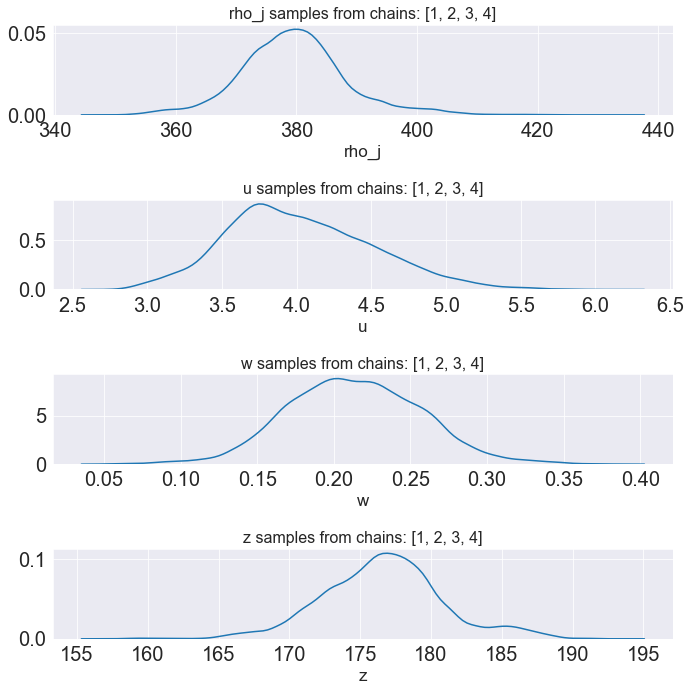

In [35]:
mcmc_vis.kdeplot(params=['rho_j','u','w','z'])

In [33]:
df_all_mean

rho_j                                                  379.593
u                                                      4.02456
w                                                     0.213421
z                                                      176.623
BC_outlet    [51.27514212705034, 51.266421390872424, 51.352...
BC_inlet     [59.662466457333785, 59.5396651076474, 59.6238...
dtype: object

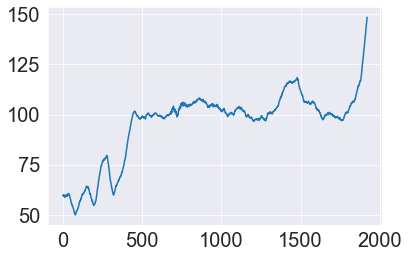

In [32]:
plt.plot(df_all_mean.BC_inlet)

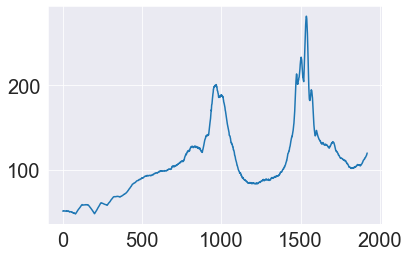

In [31]:
plt.plot(df_all_mean.BC_outlet)

In [5]:
chain_num = 3
burnin = 0

print("MSEJD: {:.4f}\n".format(mcmc_vis.MSEJD(chains=[chain_num], burnin=burnin)))

# mcmc_vis.acceptance_rate(param_type='FD',chains=[chain_num], burnin=burnin)
mcmc_vis.acceptance_rate(param_type='BC',chains=[chain_num], burnin=burnin)
# mcmc_vis.acceptance_rate(param_type='global',chains=[chain_num], burnin=burnin)
mcmc_vis.acceptance_rate(param_type='PT_beta',chains=[chain_num], burnin=burnin)
print("Total number of PT_beta moves: {}".format(mcmc_vis.PT_accepts(chain_num) + mcmc_vis.PT_rejects(chain_num)))
print("\n---")


for par in ['z','rho_j','u','w']:
    print("R_hat for {}: {:.3f}".format(par, mcmc_vis.R_hat(param=par)))
print("\n----")

for elem in range(1, 13):
    print("Acceptance rate for section {0}: {1:.1f}%".format(elem, mcmc_vis.accept_Gibbs(chain_num=chain_num, section_num=elem)))
# elem = 15
# print("Acceptance rate for section {0}: {1:.1f}%".format(elem, mcmc_vis.accept_Gibbs(chain_num=chain_num, section_num=elem)))
for BC_type in ['BC_outlet', 'BC_inlet']:
    print("\n")
    for el in [1,2,3]:
        print("{} MSEJD for chain {}: {:.0f}".format(BC_type, el, mcmc_vis.BC_MSEJD(BC_type=BC_type, chains=[el], burnin=burnin)))
        

MSEJD: 79.3472

Acceptance rate for BC parameter: 25.776%
Acceptance rate for PT_beta parameter: 21.906%
Total number of PT_beta moves: 24738

---
R_hat for z: 1.001
R_hat for rho_j: 1.000
R_hat for u: 1.000
R_hat for w: 1.001

----
Acceptance rate for section 1: 30.3%
Acceptance rate for section 2: 17.3%
Acceptance rate for section 3: 34.4%
Acceptance rate for section 4: 25.1%
Acceptance rate for section 5: 31.4%
Acceptance rate for section 6: 29.1%
Acceptance rate for section 7: 17.3%
Acceptance rate for section 8: 38.5%
Acceptance rate for section 9: 21.3%
Acceptance rate for section 10: 32.7%
Acceptance rate for section 11: 16.7%
Acceptance rate for section 12: 16.1%


BC_outlet MSEJD for chain 1: 663920
BC_outlet MSEJD for chain 2: 629033
BC_outlet MSEJD for chain 3: 652688


BC_inlet MSEJD for chain 1: 629406
BC_inlet MSEJD for chain 2: 605435
BC_inlet MSEJD for chain 3: 625109


2019/May1_correlatedPTSampler/-Run_2
------
{'density': 'Sim_data_array_DelCast_density_40t.csv', 'flow': 'Sim_data_array_DelCast_flow_40t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [1.0, 0.75, 0.56, 0.42]. Same setup as Run_9; S3 (thesis run): CorrelatedPTSampler. 4 untempered chains (so 12 cores in total)
------
Step save: 31
------




Text(0,0.5,'w')

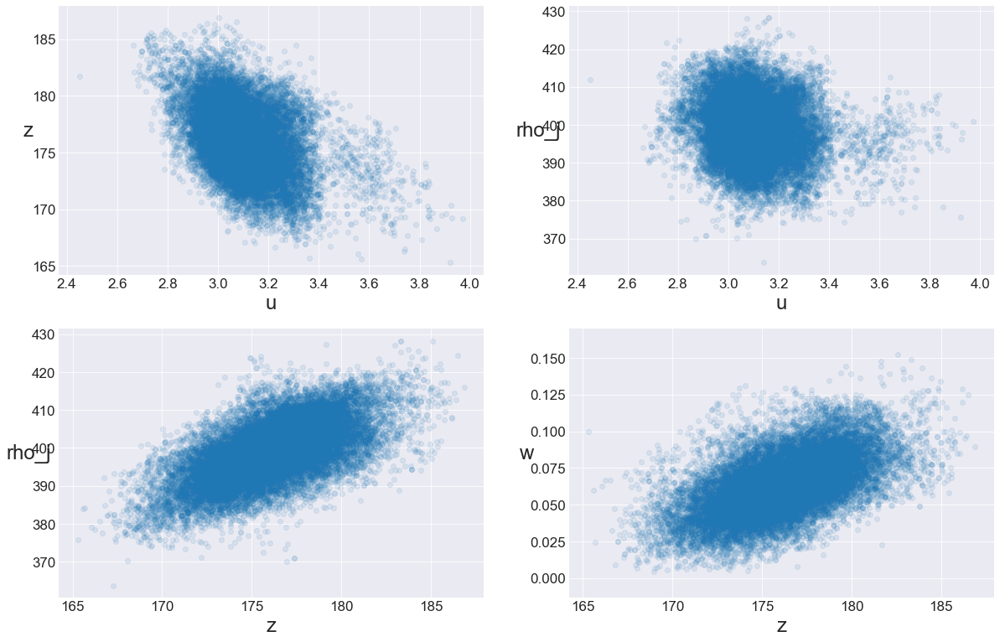

In [20]:
mcmc_vis.print_chain_info()
df_all = mcmc_vis.concat_chains(chains=[1,2,3,4])


fig, ax = plt.subplots(2,2, figsize=(20, 13))

ax[0,0].scatter(df_all.u, df_all.z, alpha=0.1)
ax[0,0].set_xlabel("u", size=24)
ax[0,0].set_ylabel("z", size=24, rotation='horizontal')

ax[0,1].scatter(df_all.u, df_all.rho_j, alpha=0.1)
ax[0,1].set_xlabel("u", size=24)
ax[0,1].set_ylabel("rho_j", size=24, rotation='horizontal')


ax[1,0].scatter(df_all.z, df_all.rho_j, alpha=0.1)
ax[1,0].set_xlabel("z", size=24)
ax[1,0].set_ylabel("rho_j", size=24, rotation='horizontal')


ax[1,1].scatter(df_all.z, df_all.w, alpha=0.1)
ax[1,1].set_xlabel("z", size=24)
ax[1,1].set_ylabel("w", size=24, rotation='horizontal')

In [8]:

plt.rcParams.update({'font.size': 20})

Number of lags for thinned chain: 967


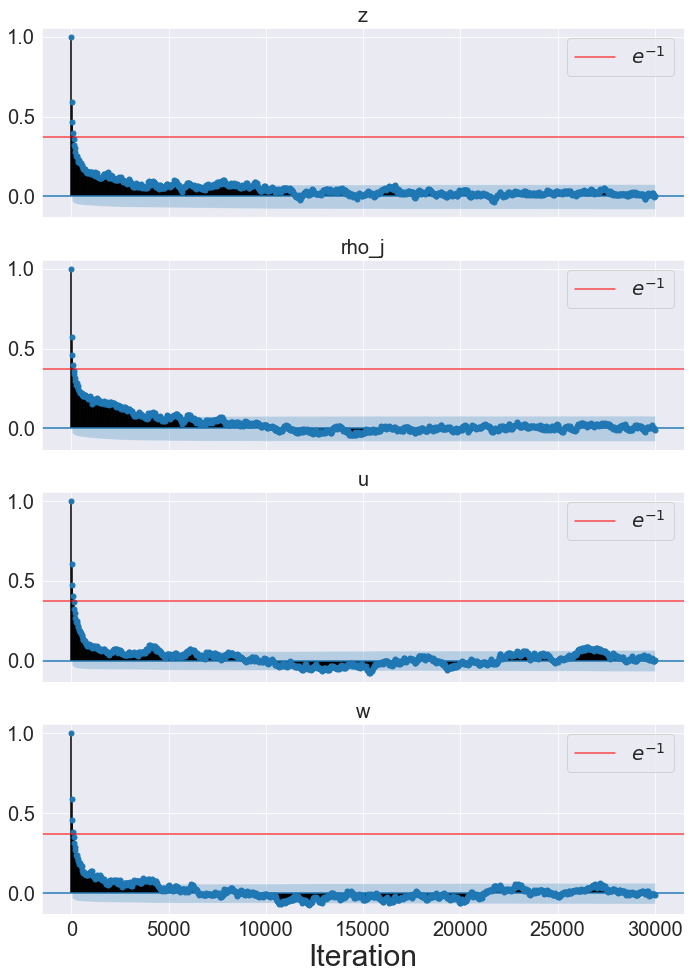

In [10]:
chain_num = 1
lags = 30000

lag_list = np.linspace(0, lags, int(lags/mcmc_vis.step_save)+1)

# ========
lags = int(lags/mcmc_vis.step_save)
print("Number of lags for thinned chain: {}".format(lags))
df = mcmc_vis.d_samples['MCMC_{}'.format(chain_num)]


fig, acf_ax = plt.subplots(4, figsize=(10, 14), sharex=True)
    
for idx, par in enumerate(['z', 'rho_j','u','w']):
    my_plot_acf(df[par], lags=lags, lag_list=lag_list, ax=acf_ax[idx])
#     acf_ax.set_xlim(1.5)
    # sns.despine()
    plt.tight_layout()
    acf_ax[idx].set_title(par, size=20)
acf_ax[-1].set_xlabel("Iteration", size=30)
plt.tight_layout()
acf_ax[0].axhline(0.37, alpha=0.7,c='r', label=r'$e^{-1}$')
acf_ax[1].axhline(0.37, alpha=0.7,c='r', label=r'$e^{-1}$')
acf_ax[2].axhline(0.37, alpha=0.7,c='r', label=r'$e^{-1}$')
acf_ax[3].axhline(0.37, alpha=0.7,c='r', label=r'$e^{-1}$')
for idx in range(0,4):
    acf_ax[idx].legend()

    # plt.savefig("delCast_DS1_FDBC-ACF-CorrPTsampler-FDs_xaxis30K.png")

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/-Run_2
------
{'density': 'data_array_70108_density_49t.csv', 'flow': 'data_array_70108_flow_49t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [0.44, 0.58, 0.76, 1]. Same setup as thesis, but with correlated PT. width=4
------
Step save: 31
------


Number of lags for thinned chain: 25


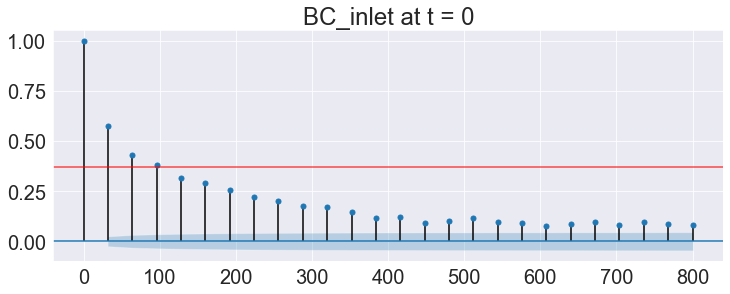

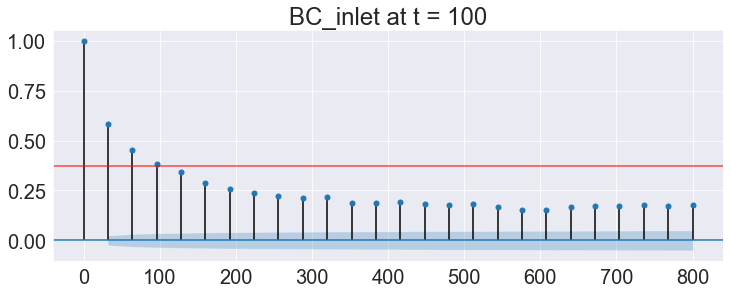

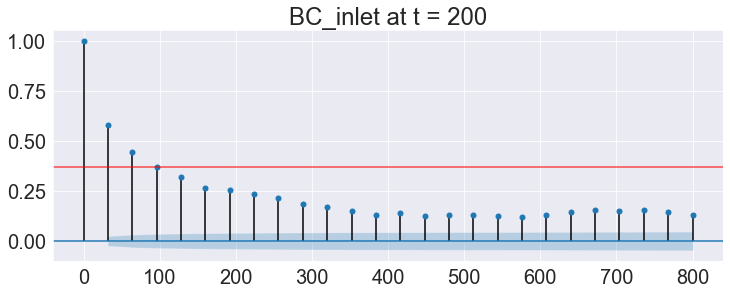

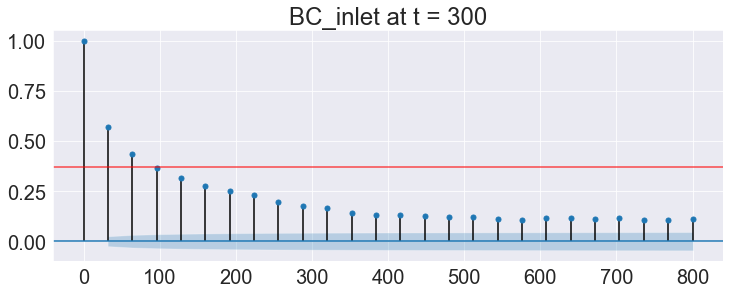

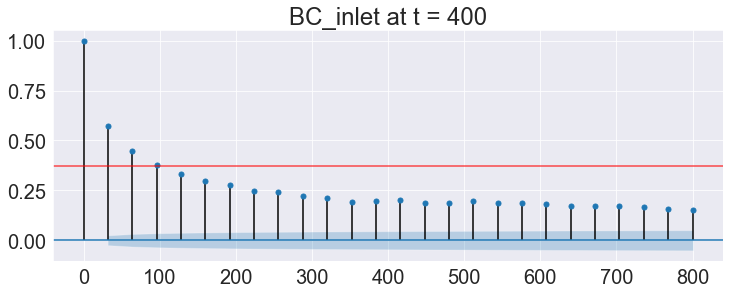

...

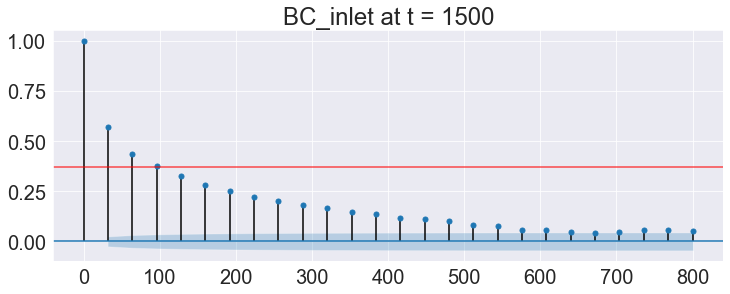

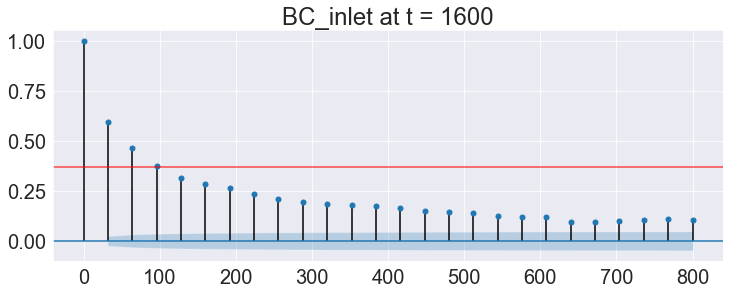

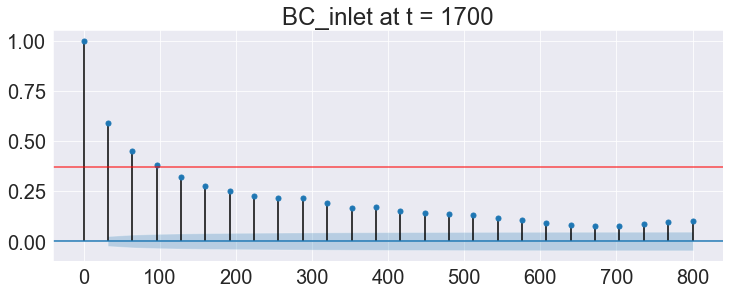

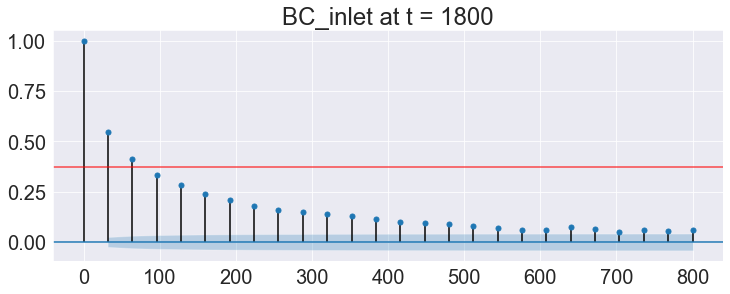

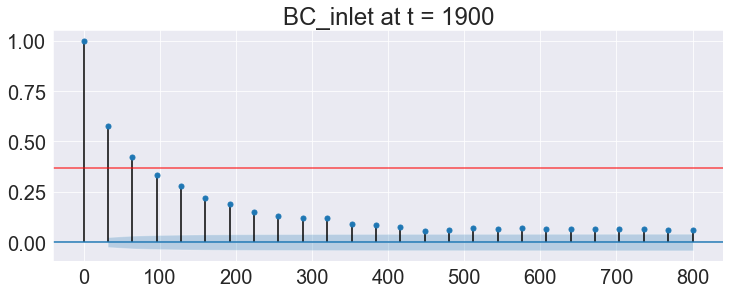

In [18]:
mcmc_vis.print_chain_info()
BC_type = "BC_outlet"
BC_type = "BC_inlet"
chain_num = 3
lags = 800

# ========
lag_list = np.linspace(0, lags, int(lags/mcmc_vis.step_save)+1)
lags = int(lags/mcmc_vis.step_save)
print("Number of lags for thinned chain: {}".format(lags))
df = mcmc_vis.d_samples['MCMC_{}'.format(chain_num)][BC_type]
for BC_t in range(0, len(df[0]), 100):
    BC_t_sams = np.array([elem[BC_t] for elem in df])

    fig = plt.figure(figsize=(20, 8))
    layout = (2, 2)
    acf_ax = plt.subplot2grid(layout, (1, 0))
    my_plot_acf(BC_t_sams, lags=lags, lag_list=lag_list, ax=acf_ax)
    acf_ax.axhline(0.37, alpha=0.7,c='r')
    plt.tight_layout()
    plt.title("{} at t = {}".format(BC_type, BC_t))

In [24]:

plt.rcParams.update({'font.size': 15})

In [9]:
config_dict = {'my_analysis_dir': '2018/June2_2018-New_dataset',
                'run_num': 1,
                'data_array_dict':{'flow': 'Sim_data_array_DelCast_flow_40t.csv',
                'density': 'Sim_data_array_DelCast_density_40t.csv'},
               'ratio_times_BCs': 40,
                      }
LWR = LWR_Solver(config_dict=config_dict)


df_mean = mcmc_vis.concat_chains(params=['z', 'rho_j','u','w'], burnin=0).mean()
df_BCs = mcmc_vis.concat_chains(params=['BC_outlet', 'BC_inlet'], burnin=0)

FD = df_mean.to_dict()
# FD = deepcopy(FD_delCast_simulated)
FD['solver'] = 'lwr_del_Cast'
FD['w'] = 1/FD['w']

FD['BC_outlet'] = df_BCs['BC_outlet'].mean()
FD['BC_inlet'] = df_BCs['BC_inlet'].mean()


title_save = None
# title_save = "DelCastSim_TRUE_PARAMS-XT_density.png"


plot_LWR_xt(FD=FD, data_variable='density', config_dict=config_dict,
           out_times=np.linspace(0,40*LWR.final_time, 1200), title_save=title_save)

NameError: name 'LWR_Solver' is not defined

In [26]:

plt.rcParams.update({'font.size': 20})

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/-Run_2
------
{'density': 'data_array_70108_density_49t.csv', 'flow': 'data_array_70108_flow_49t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [0.44, 0.58, 0.76, 1]. Same setup as thesis, but with correlated PT. width=4
------
Step save: 31
------


plotting 322 BCs


plotting 322 BCs




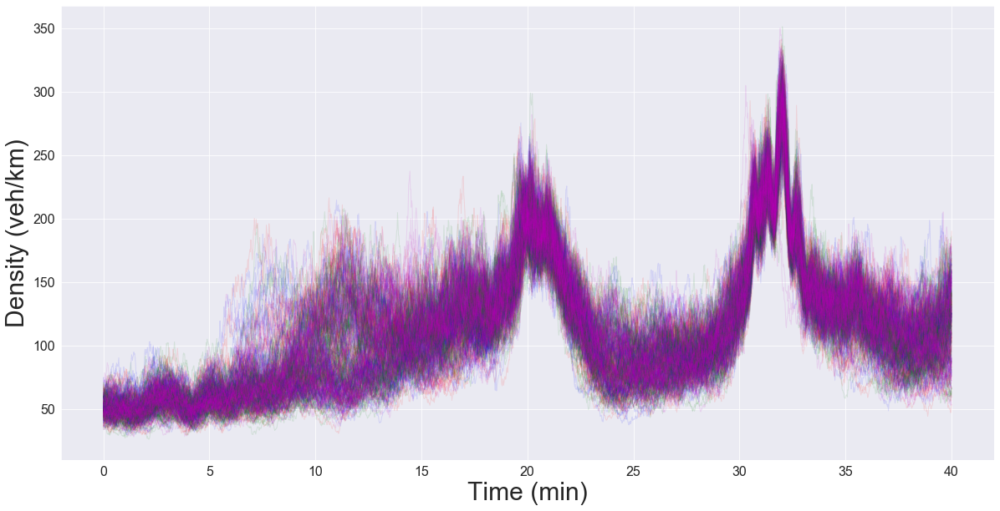

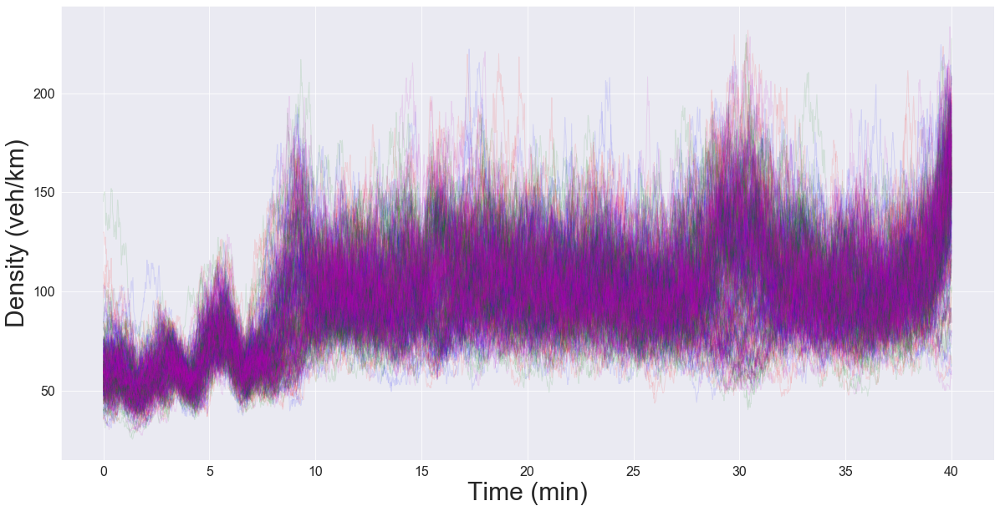

In [10]:
mcmc_vis.print_chain_info()
sample_alpha_val = 0.1
chain_list = [1,2,3,4]

N_BCs = len(mcmc_vis.d_samples['MCMC_1'].iloc[0]['BC_outlet'])
color_list = ['r','b','g','m','y']

burnin = 0
step = 80
array_BCs = mcmc_vis.concat_chains(burnin=burnin, chains=chain_list, params=['BC_inlet', 'BC_outlet']).values
array_outlet = array_BCs[:, 1]
array_inlet = array_BCs[:, 0]


print("plotting {} BCs\n\n".format((len(array_outlet[::step]))))
plt.figure(figsize=(20,10))
# for elem in array_outlet[::step]:
#     plt.plot(np.linspace(0,60, N_BCs), elem, linewidth=1, alpha=sample_alpha_val, c='r')

for chain_num in chain_list:
    for elem in mcmc_vis.concat_chains(burnin=burnin, chains=[chain_num], params=['BC_outlet']).BC_outlet.values[::step]:
        plt.plot(np.linspace(0, 40, N_BCs), elem, linewidth=1, alpha=sample_alpha_val, 
                 c=color_list[chain_num-1])
        
# plt.plot(np.linspace(0,60, N_BCs), FD_delCast_simulated['BC_outlet'], c='black', label="true BCs")
# plt.plot(np.linspace(0, 60, N_BCs), mcmc.move.BC_prior_mean['BC_outlet'], c='blue', label="prior mean")

plt.xlabel("Time (min)", size=30)
plt.ylabel('Density (veh/km)', size=30)
# plt.title("Outlet BC samples", size=25)
# plt.legend(prop={'size': 20})
# plt.savefig("figures/delCast_DS1_FDBC_CorrPT-outlet_BC_samples.png")

print("plotting {} BCs\n\n".format((len(array_inlet[::step]))))
plt.figure(figsize=(20,10))
# for elem in array_inlet[::step]:
#     plt.plot(np.linspace(0,60, N_BCs), elem, linewidth=1, alpha=sample_alpha_val, c='r')

for chain_num in chain_list:
    for elem in mcmc_vis.concat_chains(burnin=burnin, chains=[chain_num], params=['BC_inlet']).BC_inlet.values[::step]:
        plt.plot(np.linspace(0, 40, N_BCs), elem, linewidth=1, alpha=sample_alpha_val, 
                 c=color_list[chain_num-1])

# plt.plot(np.linspace(0,60, N_BCs), FD_delCast_simulated['BC_inlet'], c='black', label="true BCs")
# plt.plot(np.linspace(0, 60, N_BCs), mcmc.move.BC_prior_mean['BC_inlet'], c='blue', label="prior mean")

plt.xlabel("Time (min)", size=30)
plt.ylabel('Density (veh/km)', size=30)

# plt.title("Inlet BC samples", size=25)
# plt.legend(prop={'size': 20})
# plt.savefig("figures/delCast_DS1_FDBC_CorrPT-inlet_BC_samples.png")

In [21]:

plt.rcParams.update({'font.size': 20})

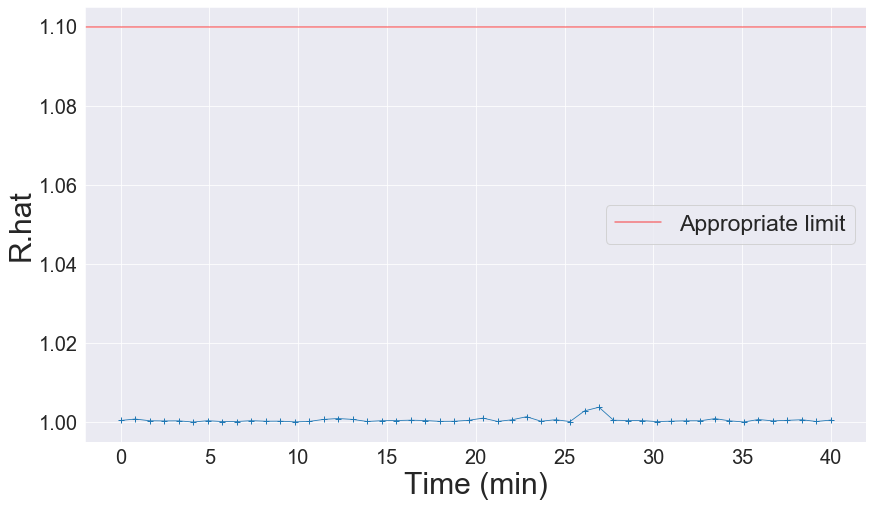

In [23]:
BC_type = 'BC_outlet'

t_list = np.linspace(0, 40, 50)
mcmc_vis.plot_BC_R_hat(BC_type=BC_type, t_list=t_list, burnin=0)
# plt.savefig("figures/delCast_sim_FDBC-outlet_Rhat.png")

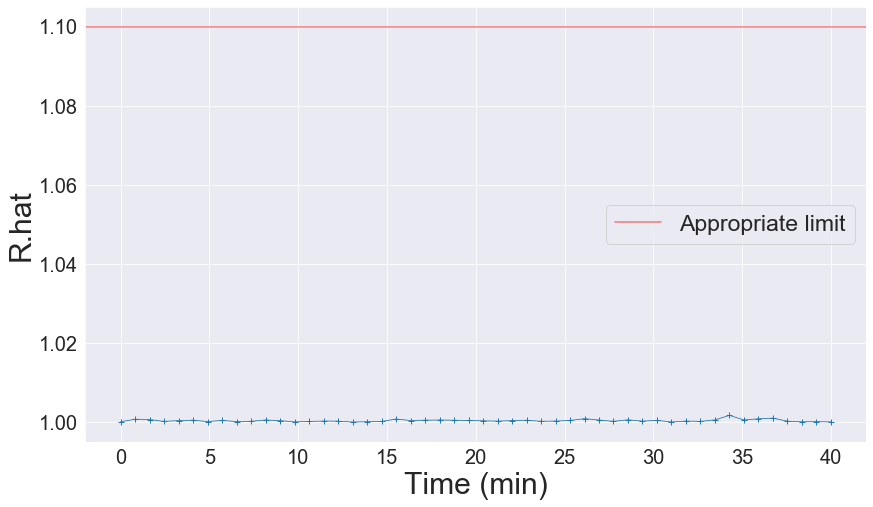

In [24]:
BC_type = 'BC_inlet'

t_list = np.linspace(0, 40, 50)
mcmc_vis.plot_BC_R_hat(BC_type=BC_type, t_list=t_list, burnin=0)
# plt.savefig("figures/delCast_sim_FDBC-inlet_Rhat.png")

2019/May1_correlatedPTSampler/-Run_2
------
{'density': 'Sim_data_array_DelCast_density_40t.csv', 'flow': 'Sim_data_array_DelCast_flow_40t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [1.0, 0.75, 0.56, 0.42]. Same setup as Run_9; S3 (thesis run): CorrelatedPTSampler. 4 untempered chains (so 12 cores in total)
------
Step save: 31
------


Running time: 5.33s


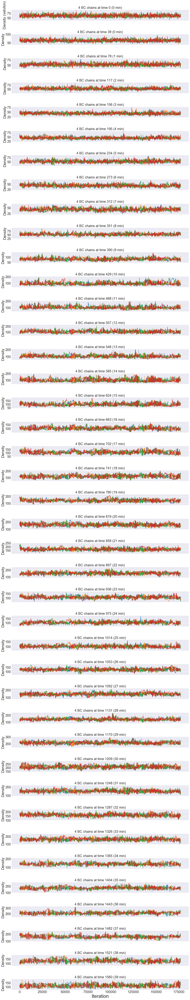

In [31]:
BC_type = 'BC_outlet'
chains = [1,2,3,4]
burnin = 0
step = 1
cell_num_list = np.arange(0, N_BCs, 39)

mcmc_vis.print_chain_info()
mcmc_vis.BC_trace_plots(BC_type, cell_num_list, step=step, chains=chains, burnin=burnin)

2019/May1_correlatedPTSampler/-Run_2
------
{'density': 'Sim_data_array_DelCast_density_40t.csv', 'flow': 'Sim_data_array_DelCast_flow_40t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [1.0, 0.75, 0.56, 0.42]. Same setup as Run_9; S3 (thesis run): CorrelatedPTSampler. 4 untempered chains (so 12 cores in total)
------
Step save: 31
------


Running time: 6.11s


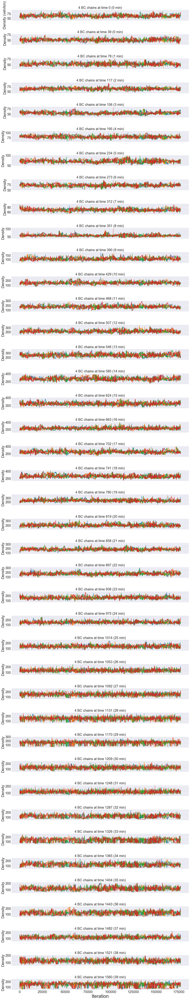

In [32]:
BC_type = 'BC_inlet'
chains = [1,2,3,4]
burnin = 0
step = 1
cell_num_list = np.arange(0, N_BCs, 39)

mcmc_vis.print_chain_info()
mcmc_vis.BC_trace_plots(BC_type, cell_num_list, step=step, chains=chains, burnin=burnin)

In [47]:
mcmc_vis.print_chain_info()

2019/Oct1_Paper_correlatedPTSampler_delCast_DS1/-Run_2
------
{'flow': 'data_array_70108_flow_49t.csv', 'density': 'data_array_70108_density_49t.csv'}
------
Upload to S3: True
------
Comments: 4 temperatures: [0.44, 0.58, 0.76, 1]. Same setup as thesis, but with correlated PT. width=4
------
Step save: 31
------




Running time: 1.12s


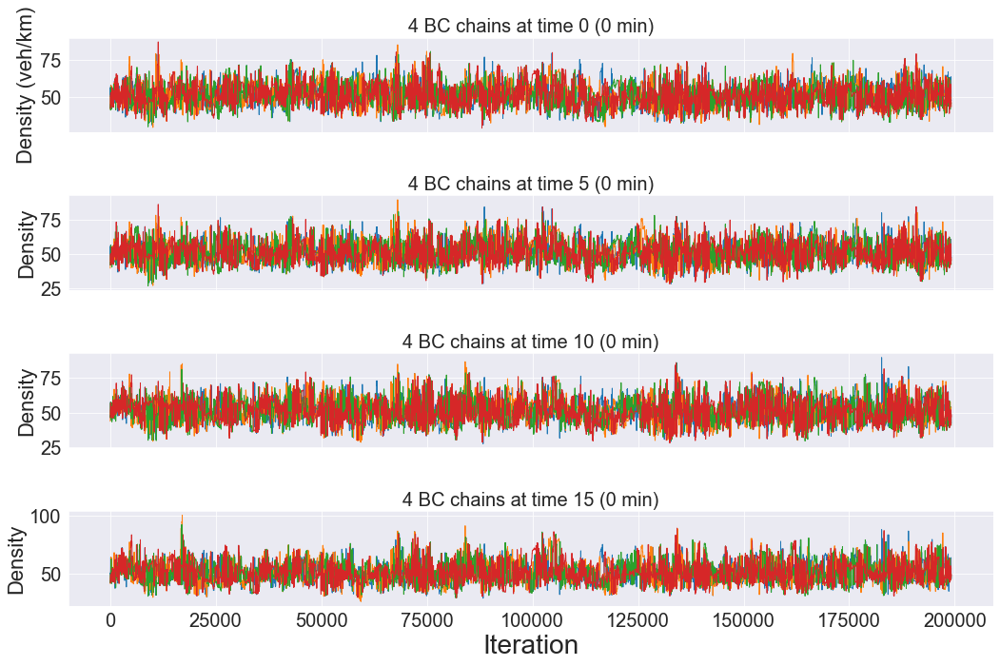

In [26]:
BC_type = 'BC_outlet'

N_BCs = len(mcmc_vis.d_samples['MCMC_1'].iloc[0].BC_outlet)
chains = [1,2,3,4,]
burnin = 0
step = 1
# cell_num_list = [0, 429, 1560,]
cell_num_list = [0, 5, 10, 15]

mcmc_vis.BC_trace_plots(BC_type, cell_num_list, step=step, chains=chains, burnin=burnin,
                       figsize=(15,10))
# plt.savefig("figures/delCast_DS1_FDBC-temp0-coldest-outlet_traceplot.png")



Running time: 1.11s


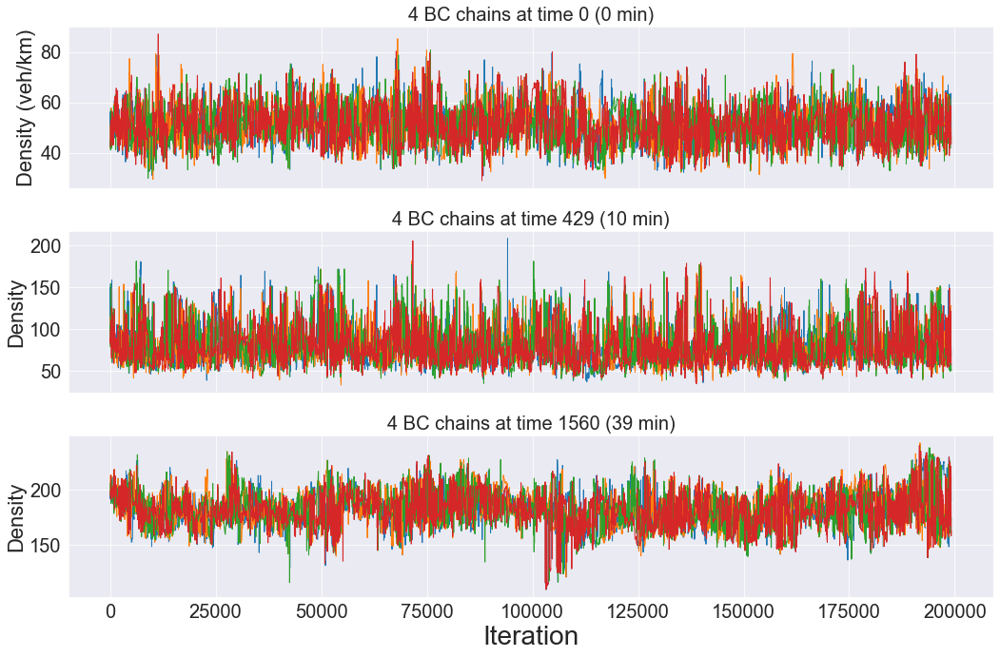

In [27]:
BC_type = 'BC_outlet'

N_BCs = len(mcmc_vis.d_samples['MCMC_1'].iloc[0].BC_outlet)
chains = [1,2,3,4,]
burnin = 0
step = 1
cell_num_list = [0, 429, 1560,]
# cell_num_list = [0, 5, 10, 15]

mcmc_vis.BC_trace_plots(BC_type, cell_num_list, step=step, chains=chains, burnin=burnin,
                       figsize=(15,10))
# plt.savefig("figures/delCast_sim_FDBC-outlet_traceplot.png")



Running time: 1.23s


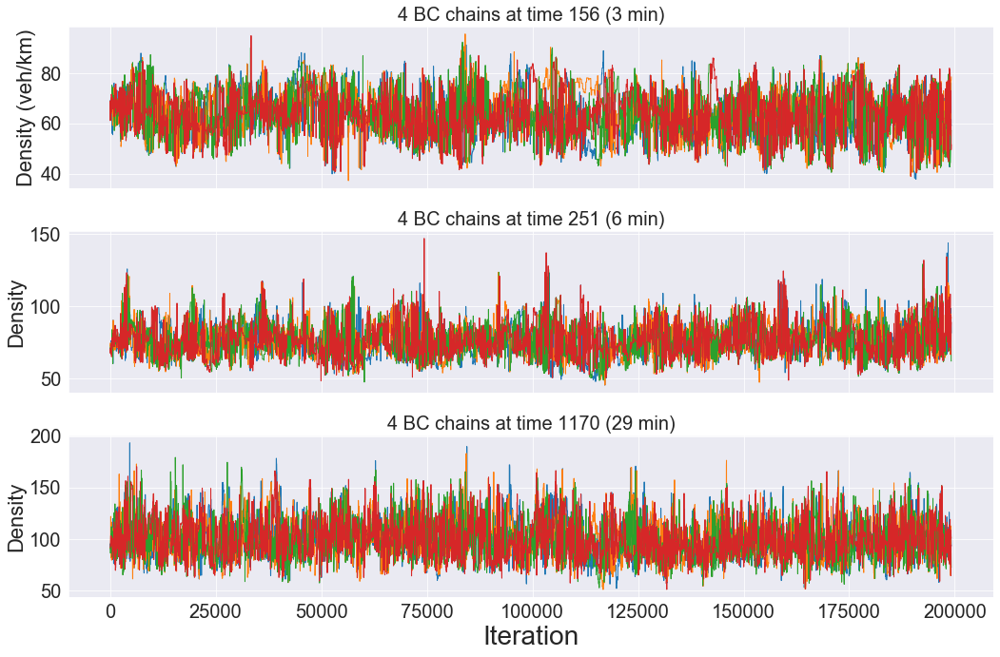

In [28]:
BC_type = 'BC_inlet'

N_BCs = len(mcmc_vis.d_samples['MCMC_1'].iloc[0].BC_outlet)
chains = [1,2,3,4]
burnin = 0
step = 1
cell_num_list = [156, 251, 1170]

mcmc_vis.BC_trace_plots(BC_type, cell_num_list, step=step, chains=chains, burnin=burnin,
                       figsize=(15,10))
# plt.savefig("figures/delCast_sim_FDBC-inlet_traceplot.png")
